<a href="https://colab.research.google.com/github/ibonetc/Data_Analytics/blob/main/AWS/IA_FaceRecog_AWSAPI_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Crear configuración de API

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Primero hay que crear un fichero con la configuración de las claves de uusario de AWS.
Crear un usuario en el servicio IAM y crear un fichero .txt con esta estructura:

[default]

aws_access_key_id=

aws_secret_access_key=

[texto del enlace](https://docs.aws.amazon.com/cli/latest/userguide/cli-configure-files.html)

Copiemos el fichero en una carpeta en nuestro Drive, activemos el drive y comencemos:

In [2]:
!mkdir -p ~/.aws &&\
  cp /content/drive/MyDrive/AWS/credencials.txt ~/.aws/credentials

Probar API con un ejemplo sencillo de análisis de sentimientos en una frase.
Para esto usaremos el servicio de Comprehend de AWS

In [3]:
!pip install boto3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.6/139.6 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.4/84.4 kB 4.0 MB/s eta 0:00:00


In [4]:
import boto3
comprehend = boto3.client(service_name='comprehend', region_name="us-east-2")
text = "Este curso es una maravilla"
comprehend.detect_sentiment(Text=text, LanguageCode='es')

{'Sentiment': 'POSITIVE',
 'SentimentScore': {'Positive': 0.9970667958259583,
  'Negative': 0.0008994952077046037,
  'Neutral': 0.0014846839476376772,
  'Mixed': 0.0005490162293426692},
 'ResponseMetadata': {'RequestId': '4d0f20f9-f305-41d3-a7c3-e911131aa3bd',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amzn-requestid': '4d0f20f9-f305-41d3-a7c3-e911131aa3bd',
   'content-type': 'application/x-amz-json-1.1',
   'content-length': '166',
   'date': 'Wed, 26 Mar 2025 18:45:37 GMT'},
  'RetryAttempts': 0}}

## Análisis de imágenes

Vamos a utilizar el servicio Rekognition

In [5]:
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

In [7]:
G_Path='/content/drive/MyDrive/Fotos_Pruebas'
cisnes=G_Path+'/cisnes.jpg'
face=G_Path+'/face.jpg'
fiesta=G_Path+'/fiesta.jpg'
london=G_Path+'/london.jpg'
nottinghan=G_Path+'/Nottingham.jpg'
cisneNegro=G_Path+'/cisneNegro.jpg'
warwich=G_Path+'/warwick.jpg'
image_text=G_Path+'/text.jpg'
grupoI=G_Path+'/grupoI.jpg'
castilloMedellin=G_Path+'/CastilloMedellin.jpg'
cuba=G_Path+'/habana.jpg'

In [6]:
sola='/content/drive/MyDrive/Fotos_Pruebas/CastilloMedellin.jpg'
grupoI='/content/drive/MyDrive/Fotos_Pruebas/grupoI.jpg'
texto='/content/drive/MyDrive/Fotos_Pruebas/text.jpg'
cosas='/content/drive/MyDrive/Fotos_Pruebas/habana.jpg'

Se debe llamar al servicio ***rekognition***

In [8]:
client = boto3.client(service_name='rekognition', region_name="us-east-2")

Hacer una función para leer la imagen en formato binario

In [9]:
def openImage(file_image):
  with open(file_image, 'rb') as openfile:
    content = openfile.read()
  return content

### Detección de rostro

Para esto hay que tener en cuenta los datos que me dan.

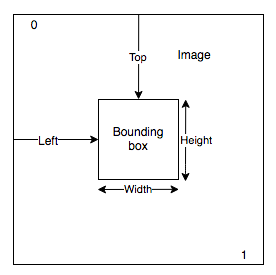

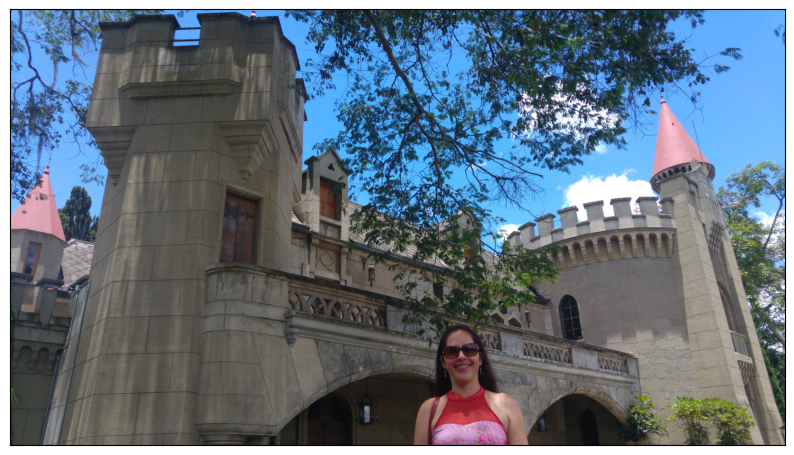

In [ ]:
img = plt.imread(sola)
plt.figure(figsize=(10,10))
plt.xticks([])
plt.yticks([])
plt.imshow(img)

In [ ]:
image=openImage(sola)
response = client.detect_faces(Image={'Bytes': image}, Attributes=["ALL"])

In [ ]:
for faceDetail in response['FaceDetails']:
  print('La edad está entre ' + str(faceDetail['AgeRange']['Low']) + ' y ' + str(faceDetail['AgeRange']['High']) + ' años')

La edad está entre 29 y 37 años


In [ ]:
img = plt.imread(sola)
img.shape

(2988, 5312, 3)

In [ ]:
img = plt.imread(sola).copy()
#img=cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
#Tomar las dimensiones de ancho y alto originales
imgWidth = img.shape[1]
imgHeight = img.shape[0]
box=response['FaceDetails'][0]['BoundingBox']
left = int(imgWidth * box['Left'])
top = int(imgHeight * box['Top'])
width = int(imgWidth * box['Width'])
height = int(imgHeight * box['Height'])
img=cv2.rectangle(img,(left,top),(left+width,top+height),(255,0,0),12)

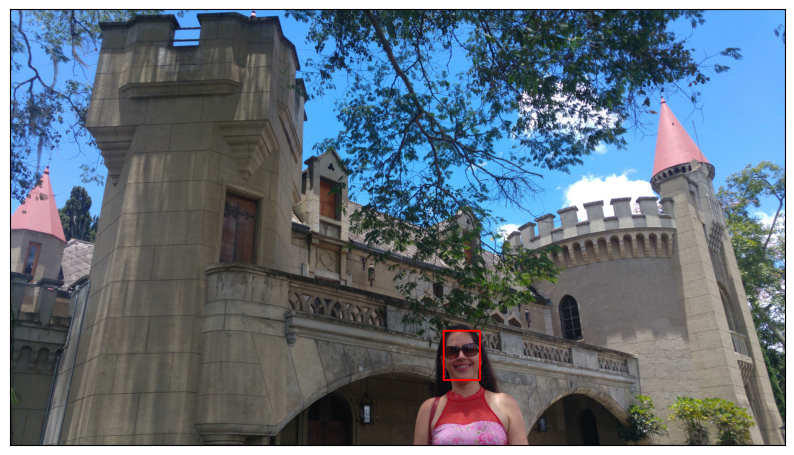

In [ ]:
plt.figure(figsize=(10,10))
plt.xticks([])
plt.yticks([])
plt.imshow(img)

### Imágenes rotadas
¿Qué pasa si la imagen está rotada?

AWS en sus procesos rota las imágenes si ellas están rotadas

La biblioteca ***piexif*** me ayuda a saber si la imagen está rotada

`piexif.load(face)["0th"][piexif.ImageIFD.Orientation]` tendrá un número

*   3: 180º
*   6: 90º
*   8: 270º
*   1: 0º


In [10]:
!pip install piexif

In [ ]:
import piexif

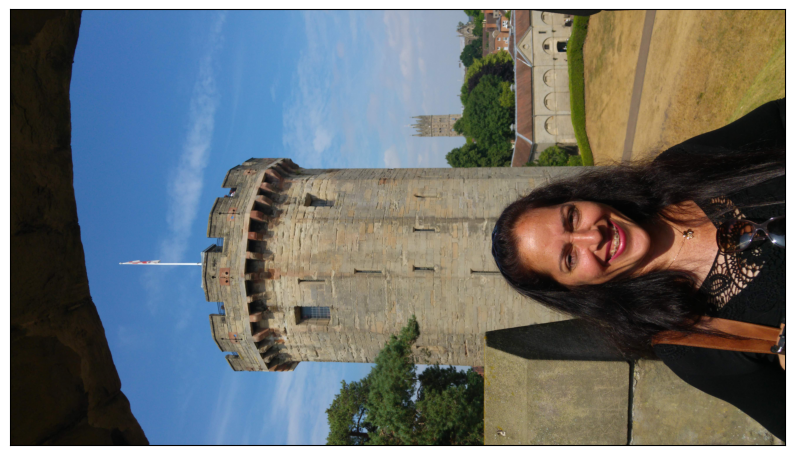

In [11]:
file_image=face
img = plt.imread(file_image)

plt.figure(figsize=(10,10))
plt.xticks([])
plt.yticks([])
plt.imshow(img)

In [ ]:
exif_dict = piexif.load(face)

In [ ]:
exif_dict

{'0th': {306: b'2018:07:21 11:02:45',
  34853: 3508,
  272: b'LG-H815P',
  531: 1,
  296: 2,
  283: (72, 1),
  274: 6,
  34665: 194,
  282: (72, 1),
  271: b'LG Electronics'},
 'Exif': {40961: 1,
  36868: b'2018:07:21 11:02:45',
  33437: (180, 100),
  37386: (442, 100),
  37378: (169, 100),
  41986: 0,
  37522: b'310895',
  40963: 2988,
  41990: 0,
  41729: b'\x01',
  37521: b'310895',
  41988: (100, 100),
  34850: 0,
  41987: 0,
  40962: 5312,
  37520: b'310895',
  37377: (11347, 1000),
  37383: 2,
  36867: b'2018:07:21 11:02:45',
  37510: b'   FM1   FC111110111:zzzzzz0 8 98 0780438df051a21c21c14c0 bac2fd1592d4434161472df934ee1351da01c5614d12c812a615322bb23a4159289b2cab15d2e5234f015d300a375a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

In [ ]:
exif_dict["0th"]

{306: b'2018:07:21 11:02:45',
 34853: 3508,
 272: b'LG-H815P',
 531: 1,
 296: 2,
 283: (72, 1),
 274: 6,
 34665: 194,
 282: (72, 1),
 271: b'LG Electronics'}

In [ ]:
exif_dict["0th"][piexif.ImageIFD.Orientation]

6

In [ ]:
exif_dict = piexif.load(sola)
exif_dict["0th"][piexif.ImageIFD.Orientation]

1

Función para rotar la imagen si tiene el parámetro de rotación

In [ ]:
img = rotate(face)
img.shape

(5312, 2988, 3)

#### Rotar la imagen según el grado

In [13]:
image=openImage(face)
response = client.detect_faces(Image={'Bytes': image}, Attributes=["ALL"])

In [16]:
img = plt.imread(face).copy()
img=cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
#Tomar las dimensiones de ancho y alto originales
imgWidth = img.shape[1]
imgHeight = img.shape[0]
box=response['FaceDetails'][0]['BoundingBox']
left = int(imgWidth * box['Left'])
top = int(imgHeight * box['Top'])
width = int(imgWidth * box['Width'])
height = int(imgHeight * box['Height'])
img=cv2.rectangle(img,(left,top),(left+width,top+height),(255,0,0),12)

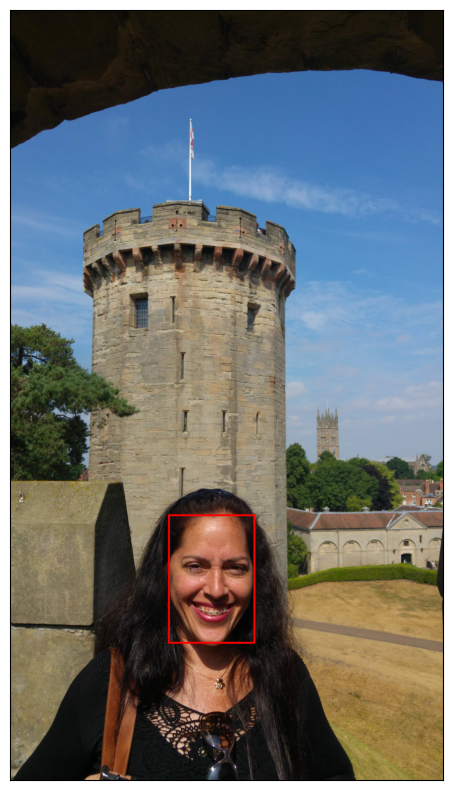

In [17]:
plt.figure(figsize=(10,10))
plt.xticks([])
plt.yticks([])
plt.imshow(img)

In [12]:
def rotate(filename):
  exif_dict = piexif.load(filename)
  img = plt.imread(filename).copy()
  if piexif.ImageIFD.Orientation in exif_dict["0th"]:
      orientation = exif_dict["0th"][piexif.ImageIFD.Orientation]
      if orientation == 3:# 180 grados
          return cv2.rotate(img, cv2.ROTATE_180)
      elif orientation == 6: # 90 grados
          return cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
      elif orientation == 8:#270
          return cv2.rotate(img, cv2.cv2.ROTATE_90_COUNTERCLOCKWISE)
      else:
          return img
  else:
      return img

Función para trazar un rectángulo en la zona detectada. Se le pasa la imagen y el box que contiene las coordenadas.

Esta nos puede servir para dibujar el rectángulo dada las coordenadas de detección de rostro o de objetos.

In [ ]:
def rectFace(img,box):
  imgWidth = img.shape[1]
  imgHeight = img.shape[0]
  left = int(imgWidth * box['Left'])
  top = int(imgHeight * box['Top'])
  width = int(imgWidth * box['Width'])
  height = int(imgHeight * box['Height'])
  img_rotate=cv2.rectangle(img,(left,top),(left+width,top+height),(255,0,0),8)
  return img, [left, top, left+width, top+height]

Función para detectar rostros. Todos los rostros que sean detectados

In [ ]:
def detectface(client, filename):
  image=openImage(filename)
  response=client.detect_faces(Image={'Bytes': image}, Attributes=["ALL"])
  img = plt.imread(filename).copy()
  #img = rotate(filename)
  faces=response['FaceDetails']
  for f in faces:
    box = f['BoundingBox']
    img,_=rectFace(img,box)
  return img, response

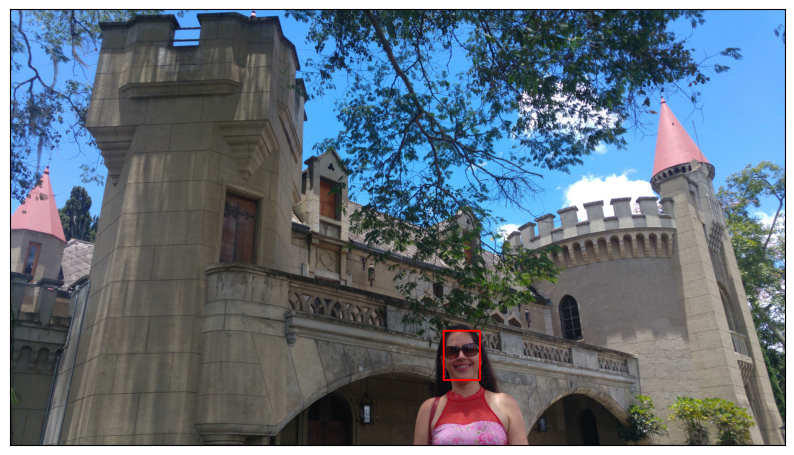

In [ ]:
plt.figure(figsize=(10,10))
img,response=detectface(client,sola)
plt.xticks([])
plt.yticks([])
plt.imshow(img)

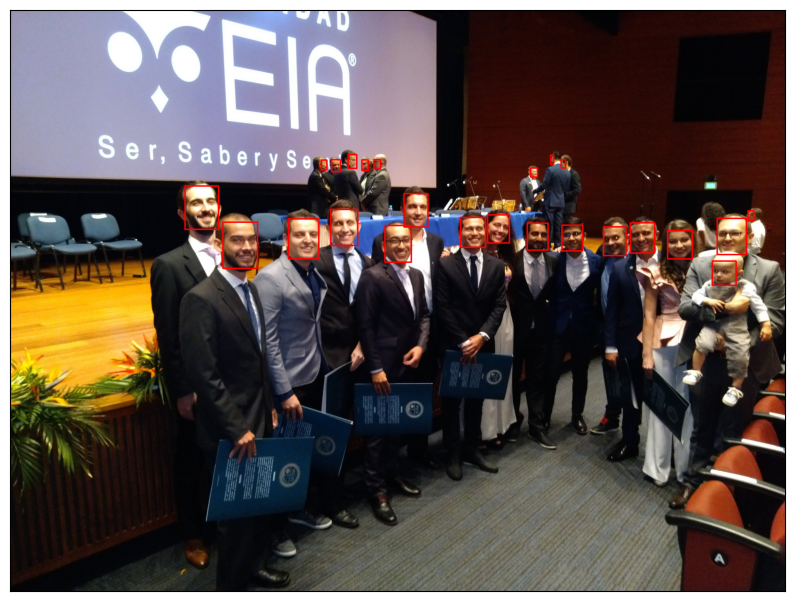

In [ ]:
plt.figure(figsize=(10,10))
img,_=detectface(client,grupoI)
plt.xticks([])
plt.yticks([])
plt.imshow(img)

## Comparación de rostros

La función ***compare_face*** permite comparar un rostro de una imagen pasada en el parámtro *SourceImage*, en otra imagen pasada como parámetro en *TargetImage*

In [ ]:
image1=openImage(sola)
image2=openImage(grupoI)
response=client.compare_faces(SimilarityThreshold=80,TargetImage={'Bytes': image2}, SourceImage={'Bytes': image1})

In [ ]:
faces=response['FaceMatches']
box=response['FaceMatches'][0]['Face']['BoundingBox']
img = rotate(grupoI)
img,_=rectFace(img,box)

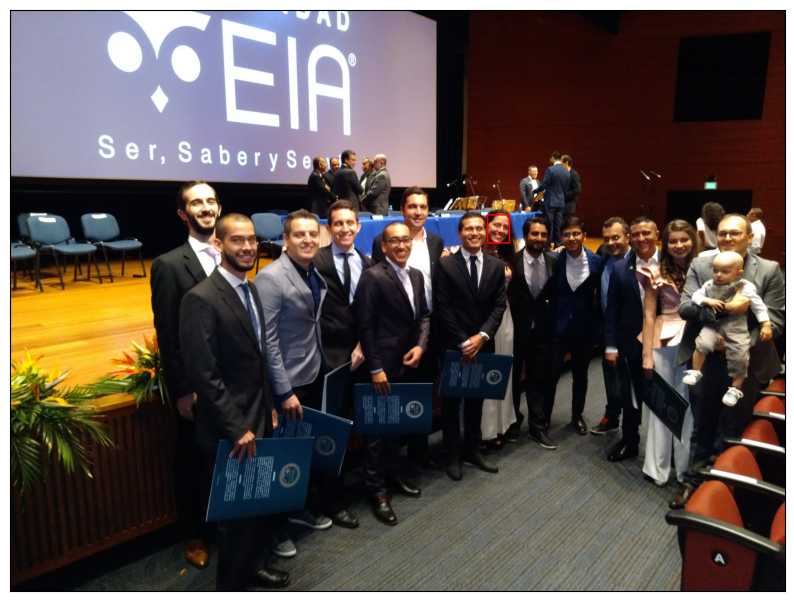

In [ ]:
plt.figure(figsize=(10,10))
plt.xticks([])
plt.yticks([])
plt.imshow(img)

Función para encontrar el rostro de la imagen *SourceImage*

In [ ]:
def compareFaces(fileSource, fileTarget):
  image1=openImage(fileSource)
  image2=openImage(fileTarget)
  response=client.compare_faces(TargetImage={'Bytes': image2}, SourceImage={'Bytes': image1})
  faces=response['FaceMatches']
  box=response['FaceMatches'][0]['Face']['BoundingBox']
  image1=rotate(fileSource)
  img = rotate(fileTarget)
  img,_=rectFace(img,box)
  return image1,img

([], [])

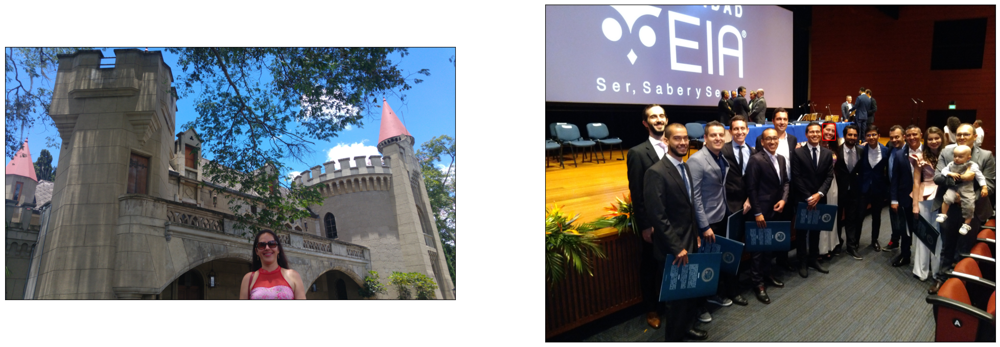

In [ ]:
from matplotlib import gridspec
img1,img2=compareFaces(sola, grupoI)
plt.figure(figsize=(25,25))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.xticks([])
plt.yticks([])
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.xticks([])
plt.yticks([])

Si las imágenes están degradadas o difusas, se puede bajar el porciento de similaridad con el parámetro: SimilarityThreshold

## Detección de objetos

In [ ]:
image=openImage(cosas)
response = client.detect_labels(Image={'Bytes': image})

In [ ]:
labels=[(e['Name'], e['Confidence']) for e in response['Labels']]
for e in labels:
  print(e)

('Clothing', 99.99998474121094)
('Shorts', 99.99998474121094)
('City', 99.99604034423828)
('Road', 99.85868072509766)
('Pickup Truck', 99.81051635742188)
('Transportation', 99.81051635742188)
('Truck', 99.81051635742188)
('Vehicle', 99.81051635742188)
('Urban', 99.6961441040039)
('Blouse', 99.654541015625)
('Adult', 99.36590576171875)
('Female', 99.36590576171875)
('Person', 99.36590576171875)
('Woman', 99.36590576171875)
('Accessories', 99.08419799804688)
('Glasses', 99.08419799804688)
('Car', 98.6380615234375)
('Jewelry', 97.9772720336914)
('Necklace', 97.9772720336914)
('Metropolis', 96.90225219726562)
('Architecture', 96.43112182617188)
('Building', 96.43112182617188)
('Office Building', 96.43112182617188)
('Bus', 91.58700561523438)
('Motorcycle', 89.67115783691406)
('Wristwatch', 87.84224700927734)
('Intersection', 79.5930404663086)
('Machine', 77.90479278564453)
('Wheel', 77.90479278564453)
('Flag', 73.69568634033203)
('Belt', 73.40401458740234)
('Face', 71.25718688964844)
('Head

In [ ]:
def detectobjects(filename):
  image=openImage(filename)
  response = client.detect_labels(Image={'Bytes': image}) # MaxLabels=10
  img=rotate(filename)
  for l in response['Labels']:
    name=l['Name']
    for i in l['Instances']:
      box=i['BoundingBox']
      img,v=rectFace(img,box)
      img=cv2.putText(img, name, (v[0],v[1]), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 4, cv2.LINE_AA)
  return img

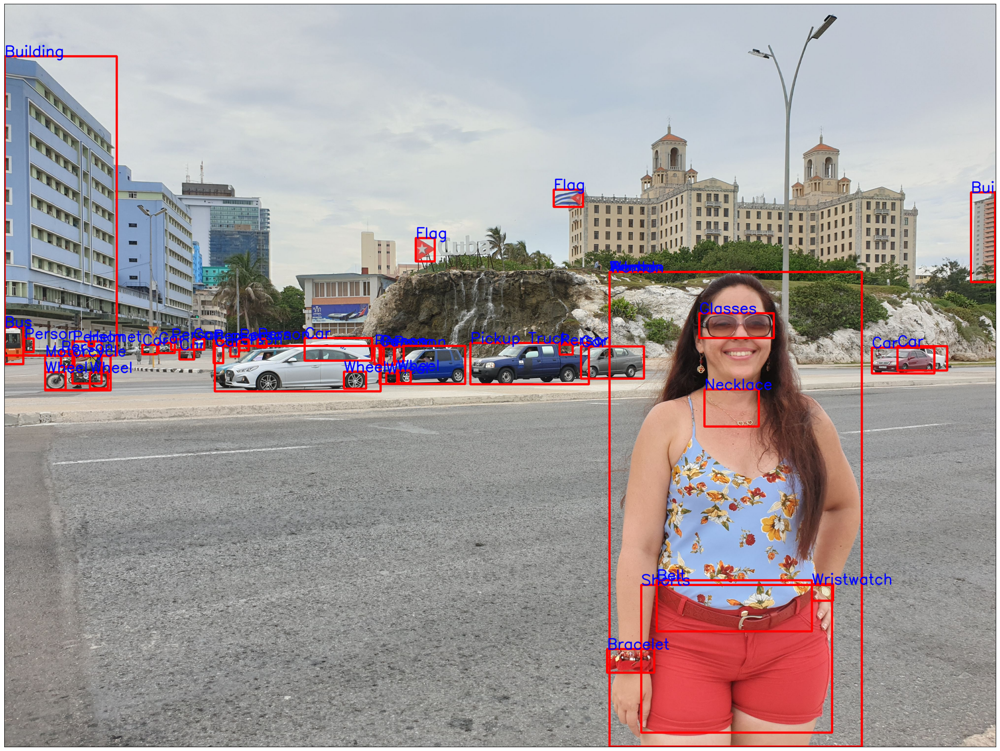

In [ ]:
img=detectobjects(cuba)
plt.figure(figsize=(30,30))
plt.xticks([])
plt.yticks([])
plt.imshow(img)

## Detección de texto

In [ ]:
image=openImage(image_text)
response = client.detect_text(Image={'Bytes': image})

In [ ]:
def detectText(filename):
  image=openImage(filename)
  response = client.detect_text(Image={'Bytes': image})
  img=rotate(filename)
  detection=response['TextDetections']
  texts=[t['DetectedText'] for t in detection]
  for i,t in enumerate(detection):
    text=t['DetectedText']
    box=t['Geometry']['BoundingBox']
    img,v=rectFace(img,box)
    img=cv2.putText(img, str(i), (v[0],v[1]), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 4, cv2.LINE_AA)
  return img,texts

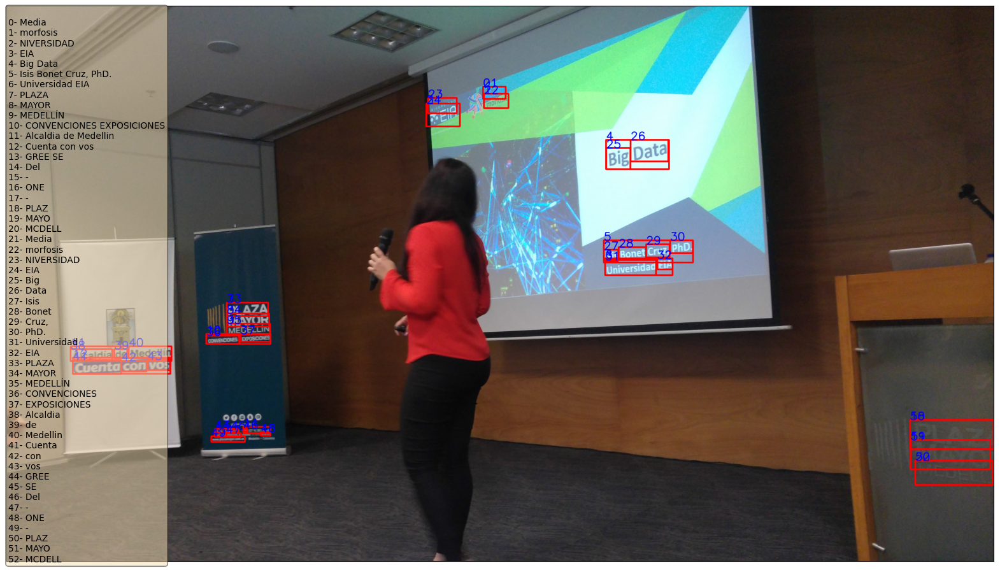

In [ ]:
img,texts=detectText(image_text)
t=''
for i,e in enumerate(texts):
  t = t+'\n'+str(i)+'- '+ e
plt.figure(figsize=(20,20))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(10, 10, t, fontsize=10,verticalalignment='top', bbox=props)
plt.xticks([])
plt.yticks([])
plt.imshow(img)